In [10]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import openpyxl
# from openpyxl import load_workbook

In [3]:
wb = load_workbook("Continuous_edition.xlsx")

In [4]:
sheet_lst = wb.sheetnames

In [71]:
def generateExcel(sheet_list):
    wb = openpyxl.Workbook()
    for i in range(len(sheet_list)):
        wb.create_sheet(index=i, title=sheet_list[i]) #index sheet postion
    wb.save(filename='./extreme_result.xlsx')
    
generateExcel(sheet_lst)    

=================== start to process Emily-V3 ===================
===== Finish processing Emily-V3 ~.~ =====
~.~
=================== start to process Emily-V8 ===================
===== Finish processing Emily-V8 ~.~ =====
~.~
=================== start to process Emily-V10 ===================


/Users/jeffery/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


===== Finish processing Emily-V10 ~.~ =====
~.~
=================== start to process GenBF-V1 ===================
===== Finish processing GenBF-V1 ~.~ =====
~.~
=================== start to process GenBF-V7 ===================
===== Finish processing GenBF-V7 ~.~ =====
~.~
=================== start to process GenMum-V3 ===================
===== Finish processing GenMum-V3 ~.~ =====
~.~
=================== start to process GenMum-V7 ===================
===== Finish processing GenMum-V7 ~.~ =====
~.~
=================== start to process GenMum-V9 ===================
===== Finish processing GenMum-V9 ~.~ =====
~.~
=================== start to process KongYeung-V4 ===================
===== Finish processing KongYeung-V4 ~.~ =====
~.~
=================== start to process KongYeung-V5 ===================
===== Finish processing KongYeung-V5 ~.~ =====
~.~
=================== start to process KongYeung-V8 ===================
===== Finish processing KongYeung-V8 ~.~ =====
~.~
==================

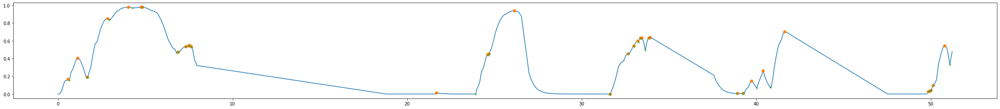

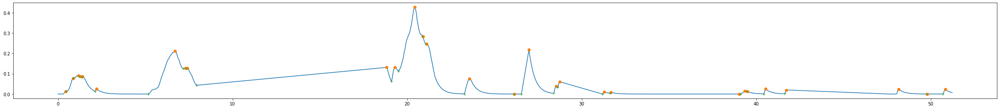

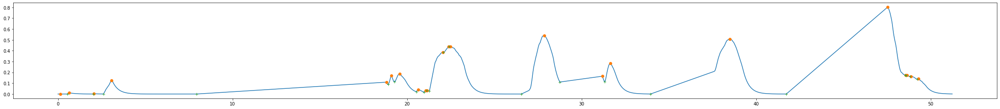

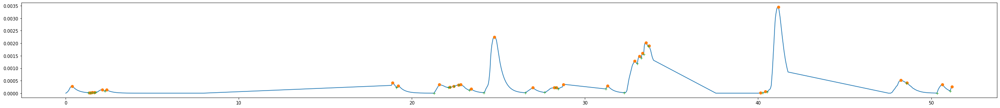

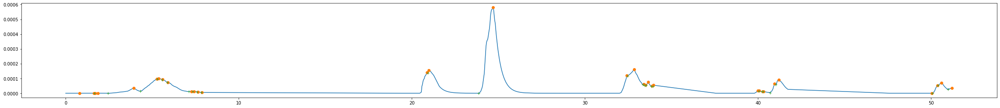

...

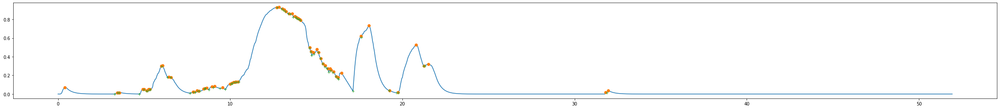

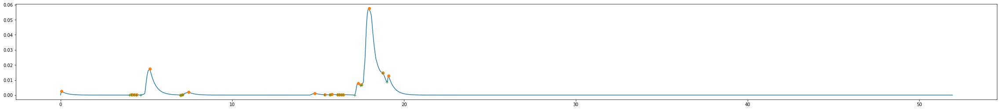

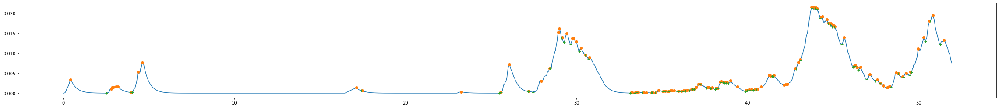

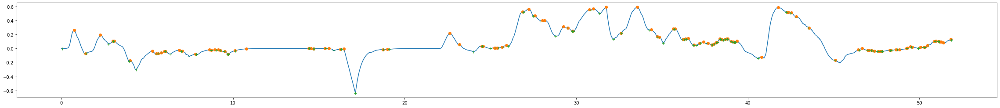

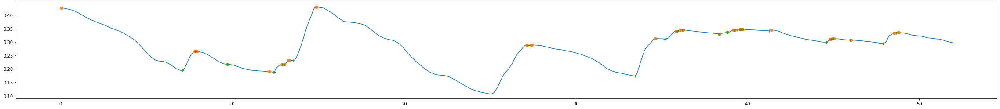

In [72]:
sheet_index = 0
for k in range(len(sheet_lst)):
# for k in [1]:
    print("=================== start to process %s ===================" % (sheet_lst[k]))
    col_hpy = np.array([i.value for i in wb[wb.sheetnames[k]]['c']][1:])
    col_sad = np.array([i.value for i in wb[wb.sheetnames[k]]['d']][1:])
    col_ang = np.array([i.value for i in wb[wb.sheetnames[k]]['e']][1:])
    col_srp = np.array([i.value for i in wb[wb.sheetnames[k]]['f']][1:])
    col_scr = np.array([i.value for i in wb[wb.sheetnames[k]]['g']][1:])
    col_dsg = np.array([i.value for i in wb[wb.sheetnames[k]]['h']][1:])
    col_val = np.array([i.value for i in wb[wb.sheetnames[k]]['i']][1:])
    col_arl = np.array([i.value for i in wb[wb.sheetnames[k]]['j']][1:])
    # row starting from 1
    # column starting from 0
    col_second = [i.value for i in wb[wb.sheetnames[k]]['a']][1:]
    col_second_fixed = [1.0 * (i.minute * 60 + i.second + i.microsecond/(1000*1000)) for i in col_second]
    
    
    mood_index = 0
    line_index = 0 
#     sheet_index = 1 # delete when index 

    for i in [col_hpy, col_sad, col_ang, col_srp, col_scr, col_dsg, col_val, col_arl]:    

        if len(signal.argrelextrema(i, np.greater)[0]) != 0:
            ext_great_index = signal.argrelextrema(i, np.greater) # greater extreme value index
            ext_less_index = signal.argrelextrema(i, np.less)     # less extreme value index
        else:
            ext_great_index = signal.argrelextrema(i, np.greater_equal) # greater extreme value index
            ext_less_index = signal.argrelextrema(i, np.less_equal)     # less extreme value index        

        ext_great_time = [col_second_fixed[j] for j in ext_great_index[0]] # time value
        ext_great_value = [i[j] for j in ext_great_index[0]]                 # greater value

        ext_less_time = [col_second_fixed[j] for j in ext_less_index[0]]   # time value
        ext_less_value = [i[j] for j in ext_less_index[0]]                 # less value

        # plot a figure to show extreme value
        plotExtreme(col_second_fixed, i, ext_great_time, ext_great_value, ext_less_time, ext_less_value)

        writeResult(sheet_index, mood_index, line_index, ext_great_time, ext_great_value, ext_less_time, ext_less_value)
        mood_index += 1
        
    print("===== Finish processing %s ~.~ =====" % (sheet_lst[k]))
    print("~.~")
    sheet_index += 1
    

### End

In [66]:
# col_second_fixed
col_hpy

array([0.0000e+00, 1.6081e-05, 1.4552e-05, ..., 3.8429e-05, 3.4774e-05,
       3.1467e-05])

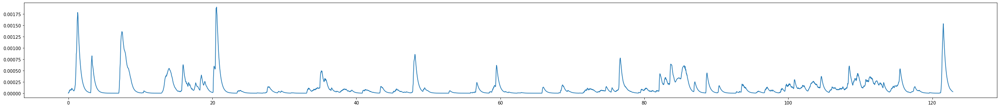

In [70]:
x = col_second_fixed
y = col_hpy
plt.figure(figsize=(40,4))
plt.plot(x, y)
#     plt.plot(g_ind, g_val, 'o')
#     plt.plot(l_ind, l_val, '+')
#     plt.close()

In [59]:
!open .

In [5]:
col_hpy = np.array([i.value for i in wb[wb.sheetnames[0]]['c']][1:])
col_sad = np.array([i.value for i in wb[wb.sheetnames[0]]['d']][1:])
col_ang = np.array([i.value for i in wb[wb.sheetnames[0]]['e']][1:])
col_srp = np.array([i.value for i in wb[wb.sheetnames[0]]['f']][1:])
col_scr = np.array([i.value for i in wb[wb.sheetnames[0]]['g']][1:])
col_dsg = np.array([i.value for i in wb[wb.sheetnames[0]]['h']][1:])
col_val = np.array([i.value for i in wb[wb.sheetnames[0]]['i']][1:])
col_arl = np.array([i.value for i in wb[wb.sheetnames[0]]['j']][1:])
# row starting from 1
# column starting from 0

In [6]:
col_second = [i.value for i in wb[wb.sheetnames[0]]['a']][1:]
col_second_fixed = [1.0 * (i.second + i.microsecond/(1000*1000)) for i in col_second]

In [7]:
# Happy	Sad	Angry	Surprised	Scared	Disgusted	Valence	Arousal
mod_dict = {
    '0': "Happy",
    '1': "Sad",
    '2': "Angry",
    '3': "Surprised",
    '4': "Scared",
    '5': "Disgusted",
    '6': "Valence",
    '7': "Arousal"
}

#### Generate Excel file to store the extreme value

#### Plot the figure

In [12]:
def plotExtreme(x, y, g_ind, g_val, l_ind, l_val):
    plt.figure(figsize=(40,4))
    plt.plot(x, y)
    plt.plot(g_ind, g_val, 'o')
    plt.plot(l_ind, l_val, '+')
#     plt.close()

#### Store the extreme value

In [13]:
def writeResult(sheet_index, mood_index, line_index, g_t, g_v, l_t, l_v):
    wb = openpyxl.load_workbook('./extreme_result.xlsx')
    sheet = wb[sheet_lst[sheet_index]]
    # add mood    
    sheet.append([
        "Mood:" + mod_dict[str(mood_index)] 
    ])
    # add great value
    sheet.append(['time_fixed', 'extreme_greater_value'])
    for i in range(len(g_t)):
        sheet.append([g_t[i], g_v[i]])
    # add less value    
    sheet.append(['time_fixed', 'extreme_less_value'])
    for i in range(len(l_t)):
        sheet.append([l_t[i], l_v[i]])
    sheet.append([""])    
    wb.save('extreme_result.xlsx')

In [57]:
len(signal.argrelextrema(col_arl, np.greater)[0])

0

In [38]:
!open .

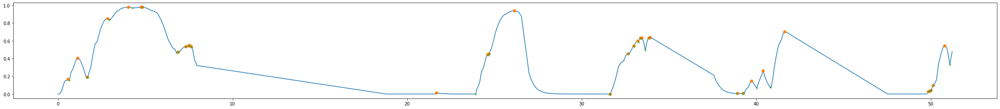

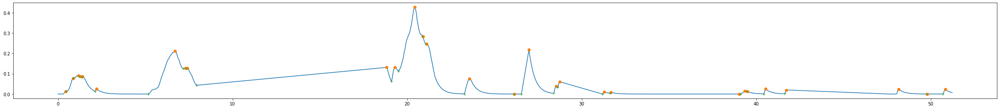

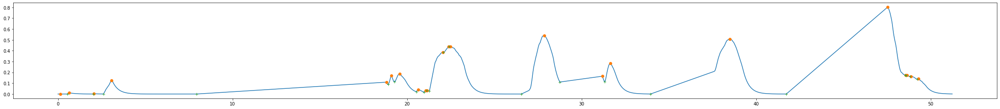

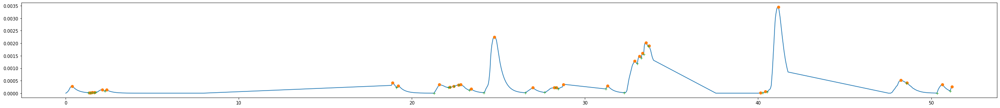

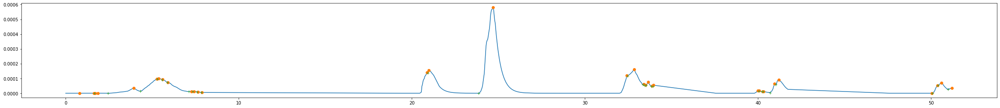

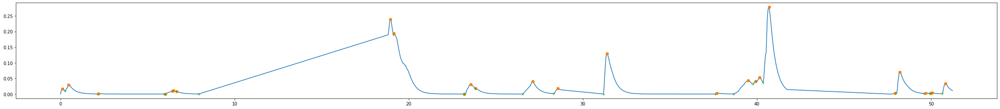

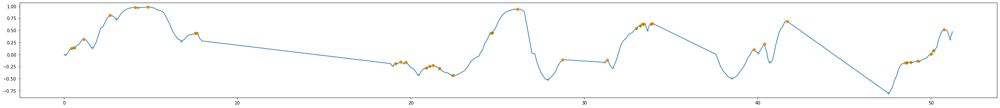

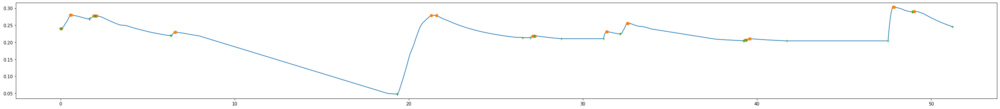

In [58]:
mood_index = 0
line_index = 0
sheet_index = 0

# for i in [col_hpy]:
for i in [col_hpy, col_sad, col_ang, col_srp, col_scr, col_dsg, col_val, col_arl]:    
    
    if len(signal.argrelextrema(i, np.greater)[0]) != 0:
        ext_great_index = signal.argrelextrema(i, np.greater) # greater extreme value index
        ext_less_index = signal.argrelextrema(i, np.less)     # less extreme value index
    else:
        ext_great_index = signal.argrelextrema(i, np.greater_equal) # greater extreme value index
        ext_less_index = signal.argrelextrema(i, np.less_equal)     # less extreme value index        
    
    ext_great_time = [col_second_fixed[j] for j in ext_great_index[0]] # time value
    ext_great_value = [i[j] for j in ext_great_index[0]]                 # greater value
    
    ext_less_time = [col_second_fixed[j] for j in ext_less_index[0]]   # time value
    ext_less_value = [i[j] for j in ext_less_index[0]]                 # less value
    
    # plot a figure to show extreme value
    plotExtreme(col_second_fixed, i, ext_great_time, ext_great_value, ext_less_time, ext_less_value)
    
    writeResult(sheet_index, mood_index, line_index, ext_great_time, ext_great_value, ext_less_time, ext_less_value)
    mood_index += 1
    print()

In [146]:
import plotly.graph_objects as go
import numpy as np

# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=col_second_fixed, y=col_happy,
                    mode='lines',
                    name='Happy Trend'))
fig.add_trace(go.Scatter(x=ext_great_time, y=ext_great_happy,
                    mode='markers', name='extreme greater'))
fig.add_trace(go.Scatter(x=ext_less_time, y=ext_less_happy,
                    mode='markers', name='extreme less'))
fig.update_layout(
    title="Happy Trend on Video Recordings",
    autosize=False,
    width=1200,
    height=600,
#     margin=dict(l=20, r=20, t=20, b=20),
#     paper_bgcolor="LightSteelBlue",
)

fig.show()